retrieving data

In [ ]:
set_file_path = '/content/drive/MyDrive/EEG Dataset/study01_p01_prep_resampled.set'
fdt_file_path = '/content/drive/MyDrive/EEG Dataset/study01_p01_prep_resampled.fdt'

import mne

# Load EEGLAB epoched dataset
epochs = mne.io.read_epochs_eeglab(set_file_path, verbose=True)

print("✅ EEG dataset loaded successfully!")

import numpy as np

print("\n📊 DATASET INFORMATION")
print("--------------------------------------------------")

print(f"Number of epochs        : {len(epochs)}")
print(f"Number of channels      : {len(epochs.ch_names)}")
print(f"Sampling frequency (Hz) : {epochs.info['sfreq']}")
print(f"Epoch start time (sec)  : {epochs.tmin}")
print(f"Epoch end time (sec)    : {epochs.tmax}")
print(f"Samples per epoch       : {len(epochs.times)}")

print("\n🧠 CHANNEL NAMES:")
print("--------------------------------------------------")
for i, ch in enumerate(epochs.ch_names, start=1):
    print(f"{i:02d}. {ch}")

data = epochs.get_data()  # shape: (epochs, channels, samples)

print("\n📐 DATA SHAPE:")
print("--------------------------------------------------")
print(f"Data shape: {data.shape}")
print("(epochs, channels, samples)")


Extracting parameters from /content/drive/MyDrive/EEG Dataset/study01_p01_prep_resampled.set...


/tmp/ipython-input-1225663878.py:7: RuntimeWarning: At least one epoch has multiple events. Only the latency of the first event will be retained.
  epochs = mne.io.read_epochs_eeglab(set_file_path, verbose=True)
/tmp/ipython-input-1225663878.py:7: RuntimeWarning: Unknown types found, setting as type EEG:
artifact: ['eye-art', 'eye-blink', 'eye-d', 'eye-fix', 'eye-l', 'eye-r', 'eye-u']
eoglpf: ['HEOG_lpf', 'REOG_lpf', 'VEOG_lpf']
label: ['artifactclasses']
paradigm: ['block']
snap: ['target_S', 'target_X', 'target_Z']
state: ['label']
  epochs = mne.io.read_epochs_eeglab(set_file_path, verbose=True)


Not setting metadata
52 matching events found
No baseline correction applied
0 projection items activated
Ready.
✅ EEG dataset loaded successfully!

📊 DATASET INFORMATION
--------------------------------------------------
Number of epochs        : 52
Number of channels      : 83
Sampling frequency (Hz) : 250.0
Epoch start time (sec)  : 0.0
Epoch end time (sec)    : 7.996
Samples per epoch       : 2000

🧠 CHANNEL NAMES:
--------------------------------------------------
01. FPz
02. FCz
03. F7
04. F3
05. Fz
06. F4
07. F8
08. FC5
09. FC1
10. FC2
11. FC6
12. T7
13. C3
14. Cz
15. C4
16. T8
17. EOGL2
18. CP5
19. CP1
20. CP2
21. CP6
22. EOGR2
23. P7
24. P3
25. Pz
26. P4
27. P8
28. EOGL3
29. O1
30. Oz
31. O2
32. EOGR3
33. AF7
34. AF3
35. AF4
36. AF8
37. F5
38. F1
39. F2
40. F6
41. EOGL1
42. FT7
43. FC3
44. FC4
45. FT8
46. EOGR1
47. C5
48. C1
49. C2
50. C6
51. TP7
52. CP3
53. CPz
54. CP4
55. TP8
56. P5
57. P1
58. P2
59. P6
60. PO7
61. PO3
62. POz
63. PO4
64. PO8
65. HEOG
66. VEOG
67. REOG
68. t

/tmp/ipython-input-1225663878.py:7: RuntimeWarning: Not setting positions of 3 eog channels found in montage:
['HEOG', 'VEOG', 'REOG']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  epochs = mne.io.read_epochs_eeglab(set_file_path, verbose=True)


In [ ]:
import mne

set_file_path = '/content/drive/MyDrive/EEG Dataset/study01_p01_prep_resampled.set'

epochs = mne.io.read_epochs_eeglab(set_file_path, verbose=True)

print("✅ Dataset Loaded")
print(f"Original channels: {len(epochs.ch_names)}")
print(f"Original epochs: {len(epochs)}")

channels_to_remove = [
    'EOGL2','EOGR2','EOGL3','EOGR3','EOGL1','EOGR1',
    'HEOG','VEOG','REOG',
    'target_X','target_Z','target_S',
    'HEOG_lpf','VEOG_lpf','REOG_lpf',
    'block','eye-l','eye-r','eye-d','eye-u',
    'eye-blink','eye-fix','eye-art','label','artifactclasses'
]

# Drop them safely (only if present)
epochs_clean = epochs.copy().drop_channels(
    [ch for ch in channels_to_remove if ch in epochs.ch_names]
)

print(f"Remaining channels after removal: {len(epochs_clean.ch_names)}")

epoch_index = 3  # Epoch 4

epoch4 = epochs_clean[epoch_index].copy()

print(f"Epochs remaining: {len(epoch4)}")

data_epoch4 = epoch4.get_data()[0]   # shape: (channels, samples)
sfreq = epoch4.info['sfreq']
ch_names = epoch4.ch_names
times = epoch4.times

print("\n📊 FINAL DATA INFORMATION")
print("--------------------------------")
print(f"Channels kept: {len(ch_names)}")
print(f"Samples in epoch 4: {data_epoch4.shape[1]}")
print(f"Sampling rate: {sfreq} Hz")


Extracting parameters from /content/drive/MyDrive/EEG Dataset/study01_p01_prep_resampled.set...
Not setting metadata
52 matching events found
No baseline correction applied
0 projection items activated
Ready.


/tmp/ipython-input-2428900693.py:5: RuntimeWarning: At least one epoch has multiple events. Only the latency of the first event will be retained.
  epochs = mne.io.read_epochs_eeglab(set_file_path, verbose=True)
/tmp/ipython-input-2428900693.py:5: RuntimeWarning: Unknown types found, setting as type EEG:
artifact: ['eye-art', 'eye-blink', 'eye-d', 'eye-fix', 'eye-l', 'eye-r', 'eye-u']
eoglpf: ['HEOG_lpf', 'REOG_lpf', 'VEOG_lpf']
label: ['artifactclasses']
paradigm: ['block']
snap: ['target_S', 'target_X', 'target_Z']
state: ['label']
  epochs = mne.io.read_epochs_eeglab(set_file_path, verbose=True)
/tmp/ipython-input-2428900693.py:5: RuntimeWarning: Not setting positions of 3 eog channels found in montage:
['HEOG', 'VEOG', 'REOG']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  epochs = mne.io.read_epochs_eeglab(set_file_path, verbose=True)


✅ Dataset Loaded
Original channels: 83
Original epochs: 52
Remaining channels after removal: 58
Epochs remaining: 1

📊 FINAL DATA INFORMATION
--------------------------------
Channels kept: 58
Samples in epoch 4: 2000
Sampling rate: 250.0 Hz


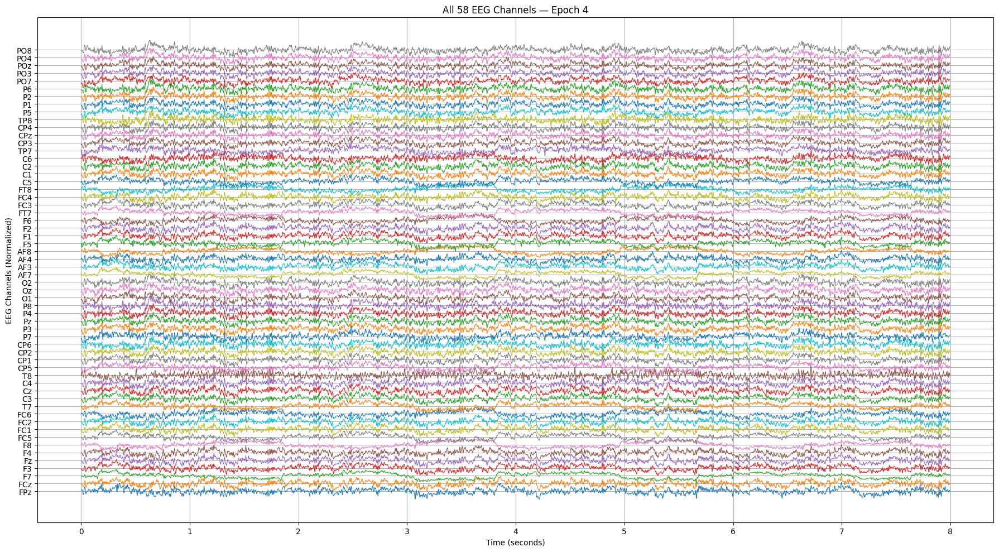

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Use the data we prepared earlier
signals = data_epoch4  # shape: (58 channels, samples)
n_channels, n_samples = signals.shape

# Create time axis
time = np.arange(n_samples) / sfreq

# Z-score normalization per channel (better visualization)
signals_norm = (signals - np.mean(signals, axis=1, keepdims=True)) / np.std(signals, axis=1, keepdims=True)

# Plot settings
scale = 5  # vertical spacing factor

plt.figure(figsize=(18, 10))

for i in range(n_channels):
    plt.plot(time, signals_norm[i] * scale + i * scale * 3, linewidth=0.8)

plt.yticks(
    [i * scale * 3 for i in range(n_channels)],
    ch_names
)

plt.xlabel("Time (seconds)")
plt.ylabel("EEG Channels (Normalized)")
plt.title("All 58 EEG Channels — Epoch 4")
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
epochs_for_ica = epoch4.copy()

print("Channels used for ICA:", len(epochs_for_ica.ch_names))

epochs_for_ica.filter(
    l_freq=0.5,
    h_freq=40.0,
    method='fir',
    fir_design='firwin',
    phase='zero'
)

print("✅ Data filtered (0.5–40 Hz) for ICA")

from mne.preprocessing import ICA

n_components = len(epochs_for_ica.ch_names)  # 58 components

ica = ICA(
    n_components=n_components,
    method='infomax',
    random_state=0,
    max_iter='auto'
)

print("⏳ Fitting ICA... (this may take some time)")
ica.fit(epochs_for_ica)

print("✅ ICA fitting complete")

ica_sources = ica.get_sources(epochs_for_ica).get_data()[0]
# shape: (components, samples)

print("ICs shape:", ica_sources.shape)



Channels used for ICA: 58
Setting up band-pass filter from 0.5 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 1651 samples (6.604 s)

✅ Data filtered (0.5–40 Hz) for ICA
⏳ Fitting ICA... (this may take some time)
Fitting ICA to data using 58 channels (please be patient, this may take a while)
Selecting by number: 58 components
Computing Infomax ICA
Fitting ICA took 0.5s.
✅ ICA fitting complete
ICs shape: (58, 2000)


/tmp/ipython-input-2060842868.py:27: RuntimeWarning: Using n_components=58 (resulting in n_components_=58) may lead to an unstable mixing matrix estimation because the ratio between the largest (34) and smallest (9.1e-06) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 57
  ica.fit(epochs_for_ica)


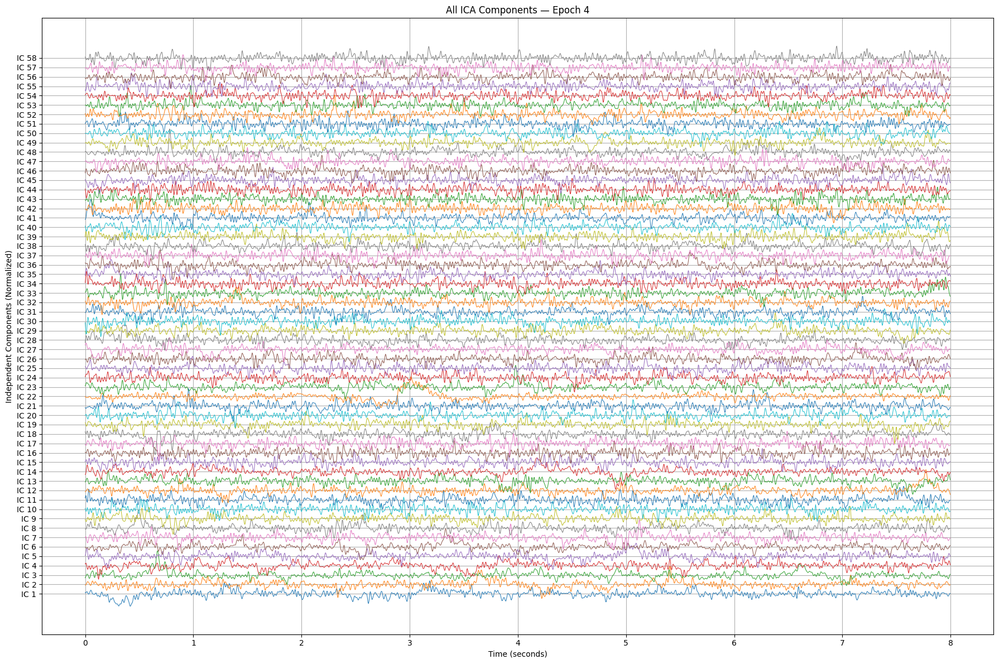

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

signals = ica_sources
n_components, n_samples = signals.shape
time = np.arange(n_samples) / sfreq

# Normalize each IC
signals_norm = (signals - np.mean(signals, axis=1, keepdims=True)) / np.std(signals, axis=1, keepdims=True)

scale = 5

plt.figure(figsize=(18, 12))

for i in range(n_components):
    plt.plot(time, signals_norm[i] * scale + i * scale * 3, linewidth=0.7)

plt.yticks(
    [i * scale * 3 for i in range(n_components)],
    [f"IC {i+1}" for i in range(n_components)]
)

plt.xlabel("Time (seconds)")
plt.ylabel("Independent Components (Normalized)")
plt.title("All ICA Components — Epoch 4")
plt.grid(True)
plt.tight_layout()
plt.show()


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
✅ Using only EEG channels: 58
✅ Channel renaming done: {'FPz': 'Fpz'}
✅ Montage applied
Setting up band-pass filter from 0.5 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 1651 samples (6.604 s)

✅ Data filtered (0.5–40 Hz)
⏳ Running ICA on 58 channels...
Fitting ICA to data using 58 channels (please be patient, this may take a while)
Selecting by number: 58 components
Computing Infomax ICA
Fitting ICA took 67.1s.


/tmp/ipython-input-113590963.py:47: RuntimeWarning: Using n_components=58 (resulting in n_components_=58) may lead to an unstable mixing matrix estimation because the ratio between the largest (48) and smallest (6.2e-06) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 57
  ica.fit(epochs_filt)


✅ ICA completed


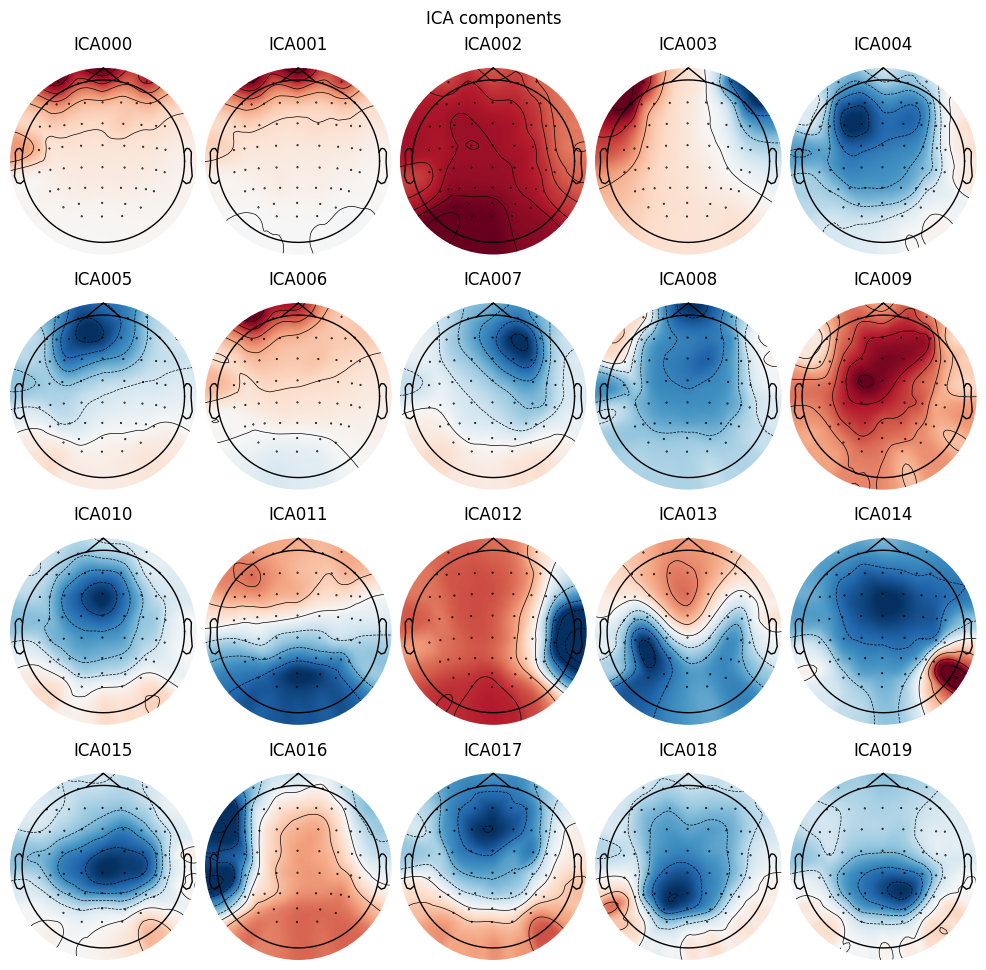

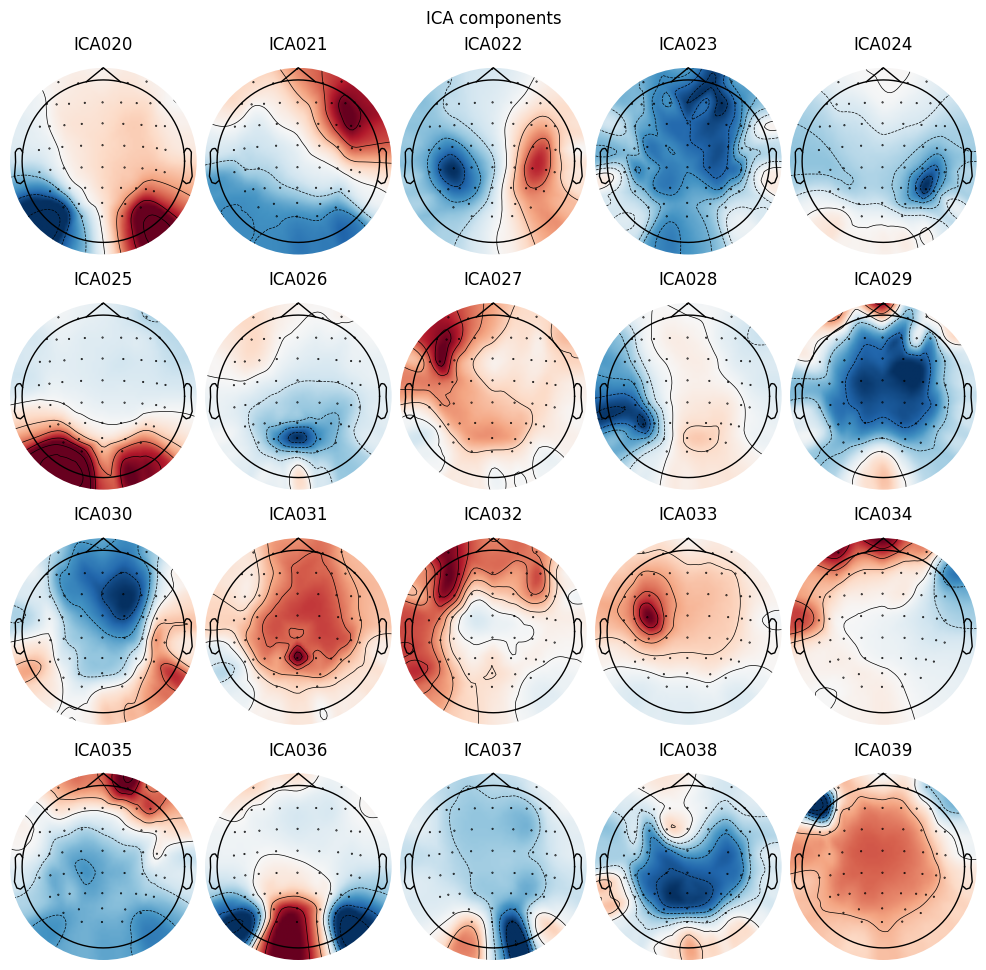

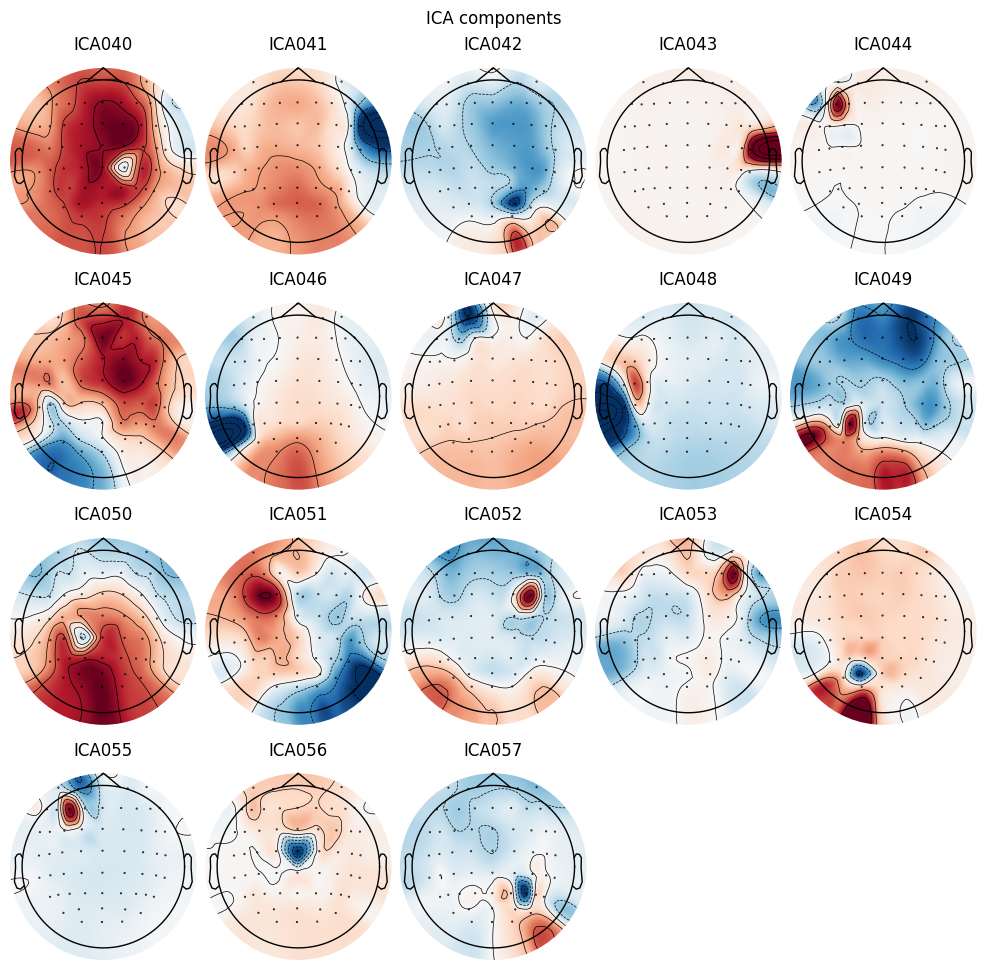

[<MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 18 Axes>]

In [ ]:
true_eeg_channels = [
    'FPz', 'FCz', 'F7', 'F3', 'Fz', 'F4', 'F8',
    'FC5', 'FC1', 'FC2', 'FC6', 'T7', 'C3', 'Cz', 'C4', 'T8',
    'CP5', 'CP1', 'CP2', 'CP6', 'P7', 'P3', 'Pz', 'P4', 'P8',
    'O1', 'Oz', 'O2', 'AF7', 'AF3', 'AF4', 'AF8', 'F5', 'F1', 'F2', 'F6',
    'FT7', 'FC3', 'FC4', 'FT8', 'C5', 'C1', 'C2', 'C6', 'TP7',
    'CP3', 'CPz', 'CP4', 'TP8', 'P5', 'P1', 'P2', 'P6',
    'PO7', 'PO3', 'POz', 'PO4', 'PO8'
]

epochs_eeg = epochs.copy().pick_channels(true_eeg_channels)

print("✅ Using only EEG channels:", len(epochs_eeg.ch_names))

rename_dict = {}
if 'FPz' in epochs_eeg.ch_names:
    rename_dict['FPz'] = 'Fpz'

epochs_eeg.rename_channels(rename_dict)
print("✅ Channel renaming done:", rename_dict)

montage = mne.channels.make_standard_montage('standard_1020')
epochs_eeg.set_montage(montage, on_missing='ignore')

print("✅ Montage applied")

epochs_filt = epochs_eeg.copy().filter(
    l_freq=0.5,
    h_freq=40.0,
    method='fir',
    fir_design='firwin',
    phase='zero'
)

print("✅ Data filtered (0.5–40 Hz)")

n_eeg_channels = len(epochs_filt.ch_names)

ica = ICA(
    n_components=n_eeg_channels,
    method='infomax',
    random_state=97,
    max_iter='auto'
)

print(f"⏳ Running ICA on {n_eeg_channels} channels...")
ica.fit(epochs_filt)

print("✅ ICA completed")



ica.plot_components(
    inst=epochs_filt,
    outlines='head',
    contours=6,
    cmap='RdBu_r',
    sphere=0.09
)


📊 Total ICs: 58


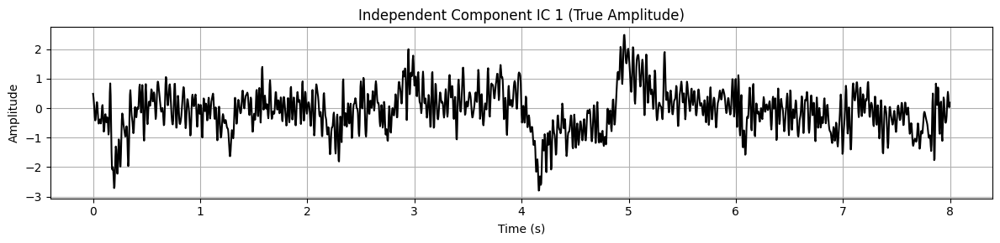

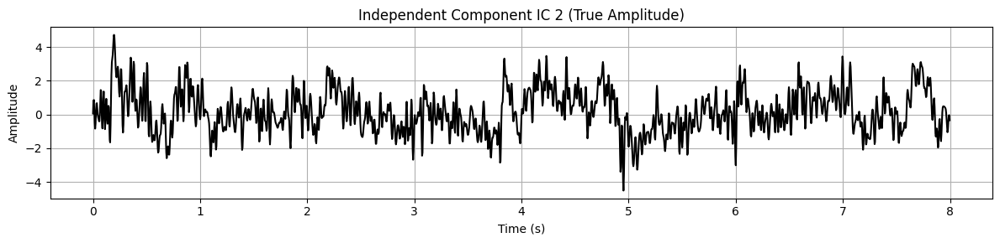

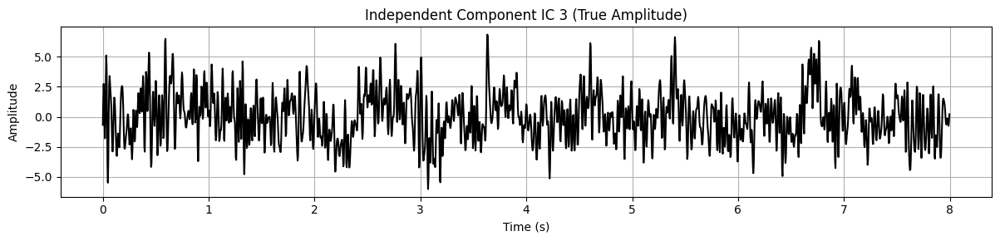

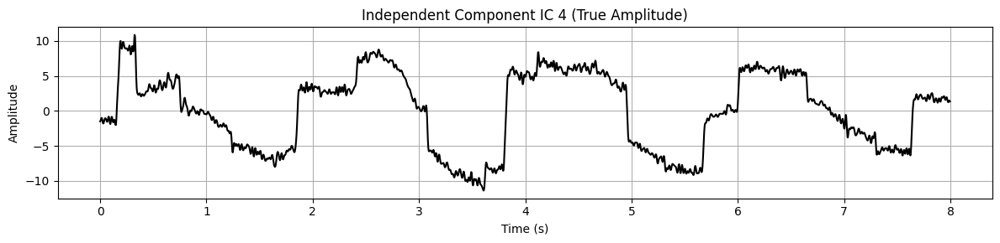

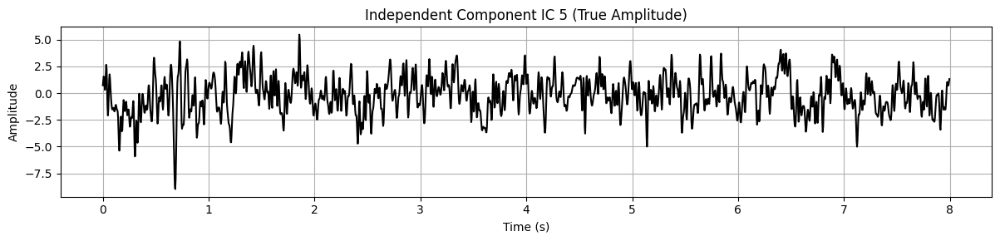

...

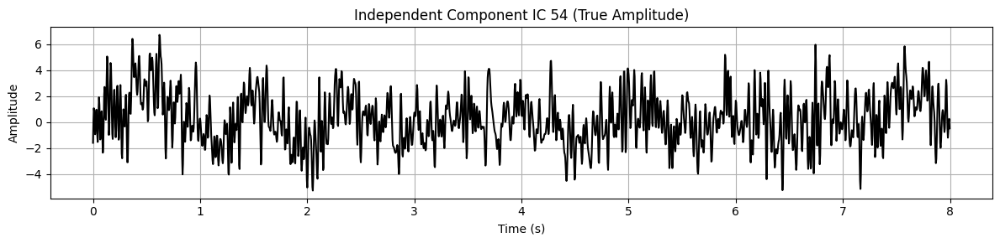

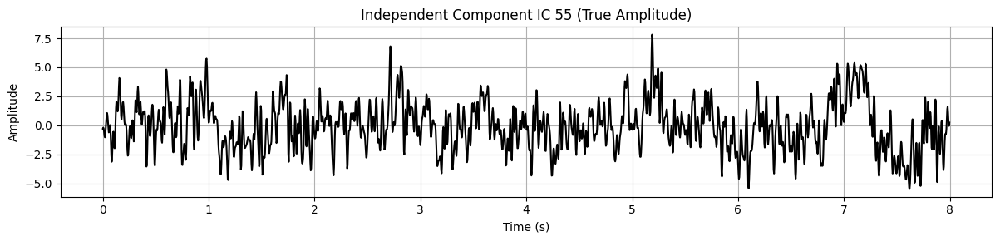

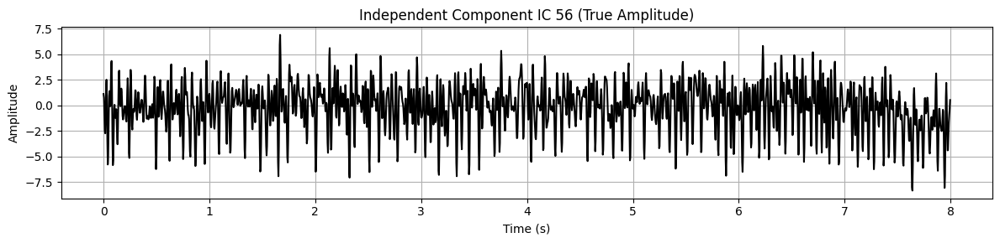

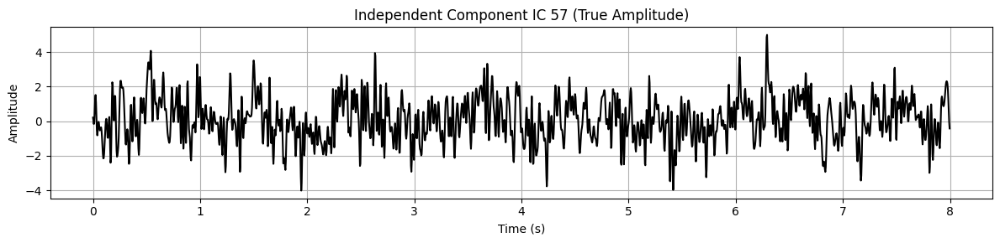

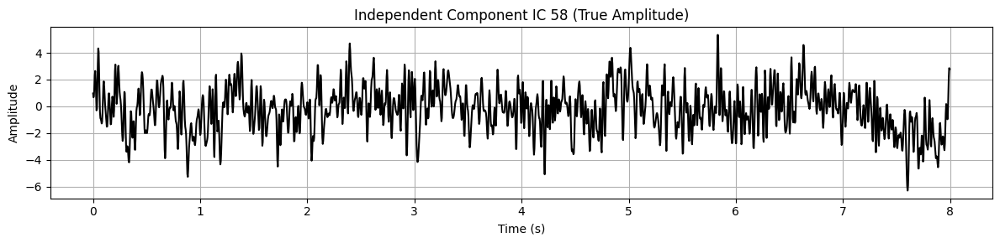

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# -------- SETTINGS --------
epoch_index = 3   # Epoch 4
scale = 1         # DO NOT over-scale, keep natural amplitude

# Get IC sources
ic_sources = ica.get_sources(epochs_filt).get_data()
times = epochs_filt.times
n_ics = ic_sources.shape[1]

print(f"📊 Total ICs: {n_ics}")

# -------- PLOT EACH IC (EEGLAB STYLE) --------
for ic_idx in range(n_ics):

    signal = ic_sources[epoch_index, ic_idx, :]  # RAW IC amplitude

    plt.figure(figsize=(12, 3))
    plt.plot(times, signal * scale, color='black')

    plt.title(f"Independent Component IC {ic_idx+1} (True Amplitude)")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


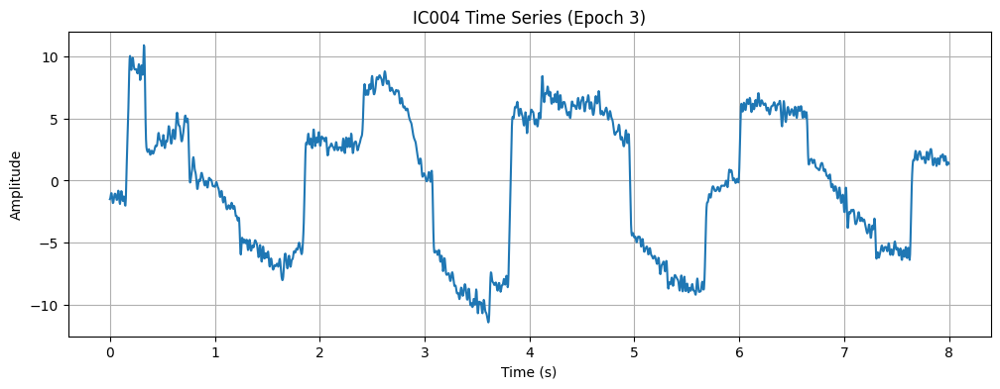

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

ic_index = 3  # IC004

# Get IC time series (epochs × ICs × time)
ic_data = ica.get_sources(epochs_filt).get_data()

# Take first epoch
signal = ic_data[3, ic_index, :]
times = epochs_filt.times

plt.figure(figsize=(12, 4))
plt.plot(times, signal)
plt.title("IC004 Time Series (Epoch 3)")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()


1. Step amplitude

🔍 Detecting lateral eye movements using Step Amplitude ΔA...


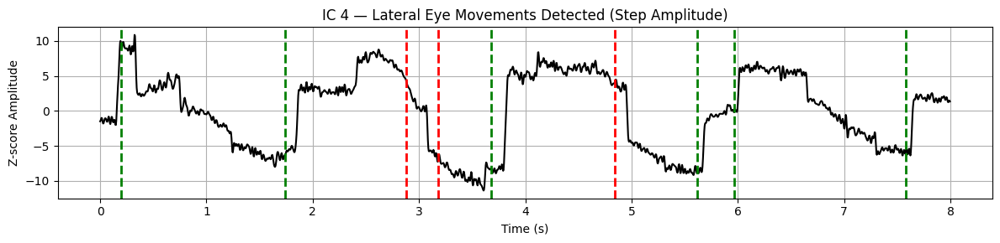

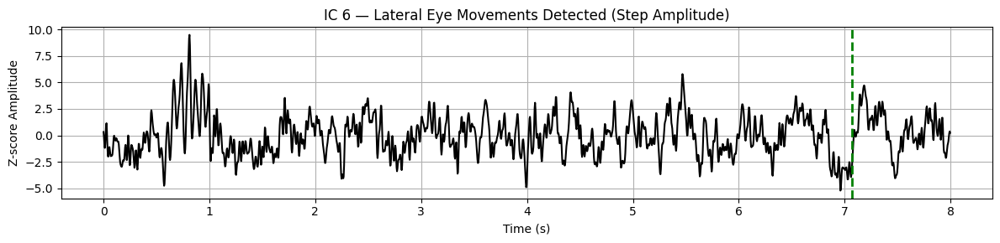

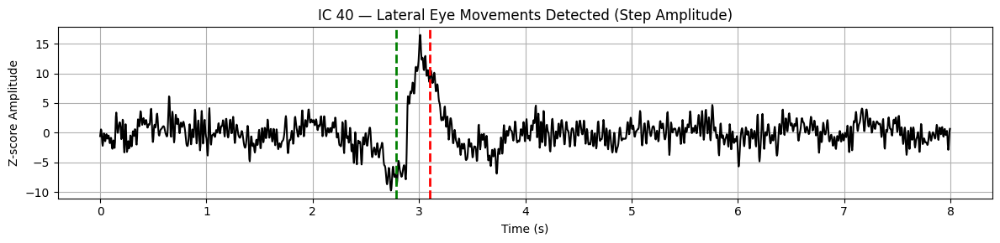

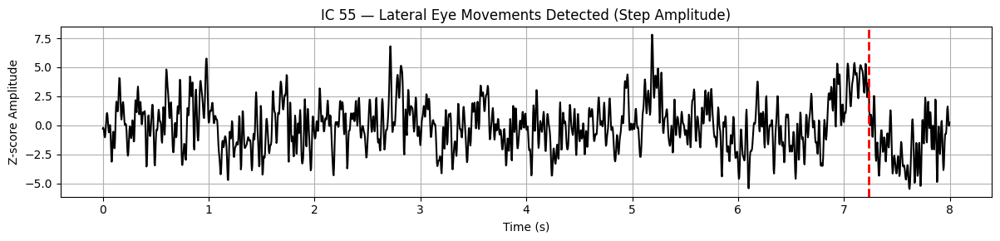

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# -------- SETTINGS --------
epoch_index = 3        # Epoch 4
window_ms = 200        # Window length in ms for mean calculation
threshold = 5       # Step amplitude threshold (Z-score)
refractory_ms = 300    # Minimum gap between detections

sfreq = epochs_filt.info['sfreq']
W = int(window_ms * sfreq / 1000)
refractory_samples = int(refractory_ms * sfreq / 1000)

# Get IC signals
ic_sources = ica.get_sources(epochs_filt).get_data()
times = epochs_filt.times
n_ics = ic_sources.shape[1]

print("🔍 Detecting lateral eye movements using Step Amplitude ΔA...")

for ic_idx in range(n_ics):

    signal = ic_sources[epoch_index, ic_idx, :]


    detected_points = []
    last_detection = -refractory_samples  # ensures first detection is allowed

    # Slide across signal
    for t in range(W, len(signal) - W):

        # Skip if too close to previous detection
        if t - last_detection < refractory_samples:
            continue

        mean_before = np.mean(signal[t-W:t])
        mean_after  = np.mean(signal[t:t+W])

        delta_A = mean_after - mean_before

        # Detect RIGHT movement (step up)
        if delta_A > threshold:
            detected_points.append((t, 'right'))
            last_detection = t

        # Detect LEFT movement (step down)
        elif delta_A < -threshold:
            detected_points.append((t, 'left'))
            last_detection = t

    # Plot only ICs where detections occurred
    if detected_points:
        plt.figure(figsize=(12, 3))
        plt.plot(times, signal, color='black')

        for t, direction in detected_points:
            color = 'green' if direction == 'right' else 'red'
            plt.axvline(times[t], color=color, linestyle='--', linewidth=2)

        plt.title(f"IC {ic_idx+1} — Lateral Eye Movements Detected (Step Amplitude)")
        plt.xlabel("Time (s)")
        plt.ylabel("Z-score Amplitude")
        plt.grid(True)
        plt.tight_layout()
        plt.show()


🔍 Detecting lateral eye movements using Step + Hold Duration...


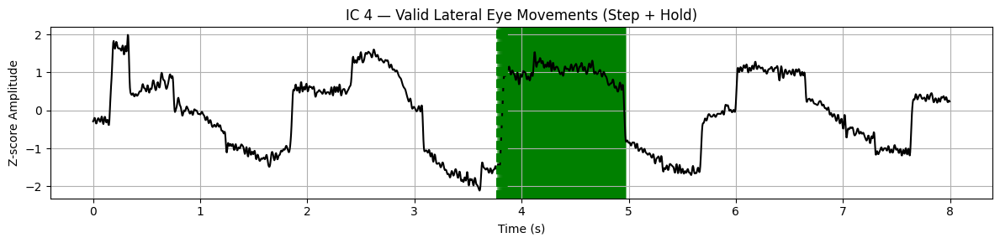

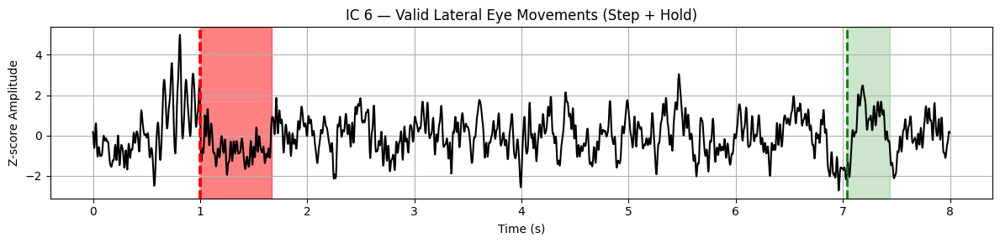

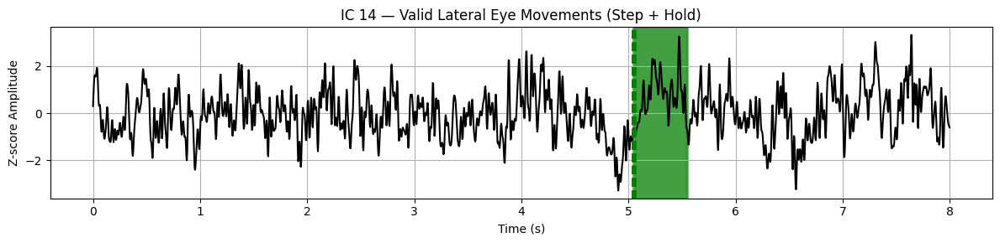

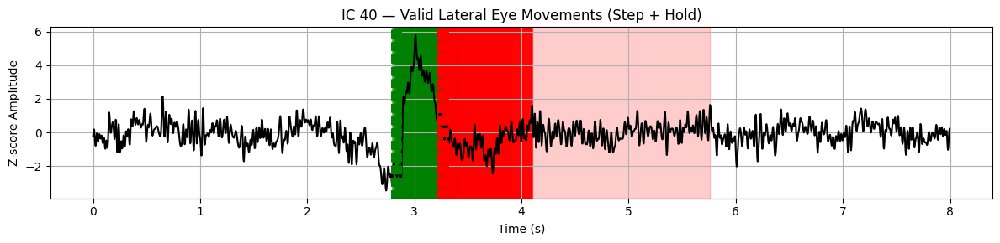

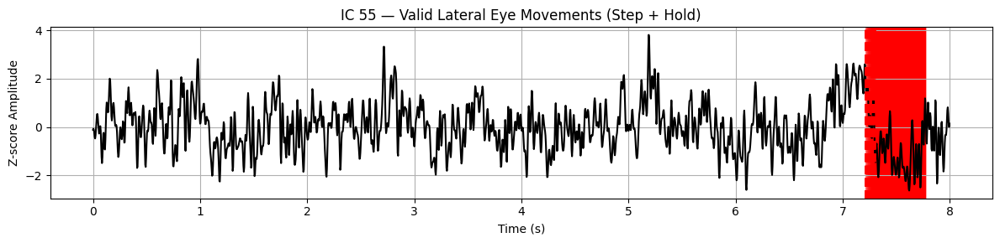

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# -------- SETTINGS --------
epoch_index = 3
window_ms = 200
step_threshold = 2.0        # ΔA threshold
hold_threshold_ms = 400     # Minimum hold duration

sfreq = epochs_filt.info['sfreq']
W = int(window_ms * sfreq / 1000)
hold_samples = int(hold_threshold_ms * sfreq / 1000)

ic_sources = ica.get_sources(epochs_filt).get_data()
times = epochs_filt.times
n_ics = ic_sources.shape[1]

print("🔍 Detecting lateral eye movements using Step + Hold Duration...")

for ic_idx in range(n_ics):

    signal = ic_sources[epoch_index, ic_idx, :]
    signal_z = (signal - np.mean(signal)) / np.std(signal)

    valid_events = []

    for t in range(W, len(signal_z) - W):

        mean_before = np.mean(signal_z[t-W:t])
        mean_after  = np.mean(signal_z[t:t+W])
        delta_A = mean_after - mean_before

        # Check for step up or down
        if abs(delta_A) > step_threshold:

            direction = 'right' if delta_A > 0 else 'left'
            baseline = mean_before
            step_level = mean_after

            # Now find when signal returns toward baseline
            return_index = None

            for k in range(t + W, len(signal_z)):
                if abs(signal_z[k] - baseline) < abs(step_level - baseline) * 0.5:
                    return_index = k
                    break

            if return_index is not None:
                T_hold = return_index - t

                if T_hold > hold_samples:
                    valid_events.append((t, return_index, direction))

    # Plot only ICs with valid lateral movements
    if valid_events:
        plt.figure(figsize=(12, 3))
        plt.plot(times, signal_z, color='black')

        for t_start, t_end, direction in valid_events:
            color = 'green' if direction == 'right' else 'red'
            plt.axvline(times[t_start], color=color, linestyle='--', linewidth=2)
            plt.axvspan(times[t_start], times[t_end], color=color, alpha=0.2)

        plt.title(f"IC {ic_idx+1} — Valid Lateral Eye Movements (Step + Hold)")
        plt.xlabel("Time (s)")
        plt.ylabel("Z-score Amplitude")
        plt.grid(True)
        plt.tight_layout()
        plt.show()
